## Setup

In [3]:
from osdatahub import FeaturesAPI, Extent, NGD
import geopandas as gpd
import pandas as pd
import folium
import leafmap
from folium.plugins import MeasureControl
import matplotlib.pyplot as plt
import mapclassify as mc
from shapely.geometry import Point
import os
import numpy as np
from convertbng.util import convert_bng, convert_lonlat
from app.os_functions import OSparam_feature, OSparam_ngd
import math

from pyaurn import importMeta

key = os.environ.get('OS_API_KEY')
crs = "EPSG:27700"

### Location Setup

AURN_meta = importMeta()
AURN_meta_ongoing = AURN_meta[AURN_meta['end_date'] == 'ongoing']
AURN_meta_ongoing = AURN_meta_ongoing[AURN_meta_ongoing['parameter'] == 'NO']

latlon = AURN_meta_ongoing.longitude[0],AURN_meta_ongoing.latitude[0]
eastnorth = convert_bng(AURN_meta_ongoing.longitude[0],AURN_meta_ongoing.latitude[0])
X = eastnorth[0]
Y = eastnorth[1]
radius = 50
clip = True
product = 'topographic_area'


## Line bearings to Buildings

In [2]:
BuildingData = OSparam_feature(X, Y, radius,product,key, clip)
BuildingGeoSeries = BuildingData['geometry'][BuildingData['Theme'] == 'Buildings']
BuildingGeoSeries = BuildingGeoSeries.to_crs(27700)
BuildingDistances = BuildingGeoSeries.distance(Point(X,Y))
LineDistances = BuildingGeoSeries.shortest_line(Point(X,Y))

In [ ]:
import folium
from shapely.geometry import Point, LineString

# Define the line and start/end points
line = LineDistances.iloc[0]
end_point = Point(line.coords[0])
start_point = Point(line.coords[-1])
line_points = [p for p in line.coords]
lats = convert_lonlat(*zip(*line_points))[0]
lons = convert_lonlat(*zip(*line_points))[1]

points = []
for i in range(len(lats)):
    points.append([lons[i], lats[i]])

start_lon, start_lat = convert_lonlat(start_point.x, start_point.y)
end_lon,end_lat = convert_lonlat(end_point.x, end_point.y)

# Define the projection
import pyproj
geodesic = pyproj.Geod(ellps='WGS84')
fwd_azimuth,back_azimuth,distance = geodesic.inv(start_lon, start_lat,end_lon,end_lat)

print(calculate_bearing(end_point,start_point))

# Create a folium map centered on the line
m = folium.Map(location=[start_lat[0],start_lon[0]], zoom_start=19)

# # Add the line to the map in blue
folium.PolyLine(points, color='blue',popup=back_azimuth).add_to(m)

# # Add the start point to the map in red
folium.Marker(location=[start_lat[0],start_lon[0]], icon=folium.Icon(color='green')).add_to(m)

# # Add the end point to the map in green
folium.Marker(location=[end_lat[0], end_lon[0]], icon=folium.Icon(color='red')).add_to(m)

# # Display the map
m
# points



## NGD

In [4]:
ngd_collections = NGD.get_collections()
collections = {}

for i in ngd_collections['collections']:
    collections.update({i['title']:i['id']})

recipe = ['Average And Indicative Speed',
'Pavement Link',
'Pavement',
'Road Link',]
import difflib

data_collections = [collections[difflib.get_close_matches(i, collections.keys())[0]] for i in recipe]

data_dict = {'average_speeds': data_collections[0], 'pavement1': data_collections[1], 'pavement2': data_collections[2], 'roads': data_collections[3]}
data_dict


{'average_speeds': 'trn-rami-averageandindicativespeed-1',
 'pavement1': 'trn-ntwk-pavementlink-1',
 'pavement2': 'trn-ntwk-pavementlink-1',
 'roads': 'trn-ntwk-roadlink-2'}

In [24]:
buildings = OSparam_feature(X, Y, radius,'topographic_area',key, clip)
buildings = buildings[buildings['Theme'] == 'Buildings'].set_crs(27700)
averagespeed = OSparam_ngd(X, Y, radius,data_collections[0],key, clip=False)
pavement = OSparam_ngd(X, Y, radius,data_collections[1],key, clip=False)
road = OSparam_ngd(X, Y, radius,data_collections[2],key, clip=False)

In [21]:
buildings_headers = ['AbsHMin','AbsH2', 'AbsHMax', 'RelH2', 'RelHMax', 'BHAConf', 'Shape_Length','Shape_Area']
averagespeed_headers = list(averagespeed.columns)[6:-1]
pavement_headers = list(pavement.columns)[6:-1]
road_headers = list(road.columns)[6:-1]

In [27]:
m = folium.Map(location=[latlon[1], latlon[0]], zoom_start=18)
fg = folium.FeatureGroup(name="data")
fg.add_child(folium.Marker([latlon[1], latlon[0]]))
fg.add_child(folium.GeoJson(buildings,popup=folium.GeoJsonPopup(fields=buildings_headers),style_function=lambda x: {'color':'black'}))
# fg.add_child(folium.GeoJson(averagespeed.set_crs(4326),popup=folium.GeoJsonPopup(fields=averagespeed_headers),style_function=lambda x: {'color':'red'}))
# fg.add_child(folium.GeoJson(pavement.set_crs(4326),popup=folium.GeoJsonPopup(fields=pavement_headers),style_function=lambda x: {'color':'green'}))
# fg.add_child(folium.GeoJson(road.set_crs(4326),popup=folium.GeoJsonPopup(fields=road_headers),style_function=lambda x: {'color':'blue'}))

m.add_child(fg)

m



## Features

In [11]:
from osdatahub.FeaturesAPI.feature_products import PREMIUM_NEW,OPEN_NEW
PREMIUM_NEW,OPEN_NEW

({'topographic_area': Product(name='Topography_TopographicArea', geometry='MultiPolygon'),
  'topographic_point': Product(name='Topography_TopographicPoint', geometry='Point'),
  'topographic_line': Product(name='Topography_TopographicLine', geometry='MultiLineString'),
  'water_network_link': Product(name='WaterNetwork_WatercourseLink', geometry='MultiLineString'),
  'water_network_node': Product(name='WaterNetwork_HydroNode', geometry='Point'),
  'path_network_link': Product(name='DetailedPathNetwork_RouteLink', geometry='MultiLineString'),
  'path_network_node': Product(name='DetailedPathNetwork_RouteNode', geometry='Point'),
  'highways_connecting_link': Product(name='Highways_ConnectingLink', geometry='MultiLineString'),
  'highways_connecting_node': Product(name='Highways_ConnectingNode', geometry='Point'),
  'highways_ferry_link': Product(name='Highways_FerryLink', geometry='MultiLineString'),
  'highways_ferry_node': Product(name='Highways_FerryNode', geometry='Point'),
  'high

## Functions

#### Calculate Bearing

In [4]:
import geopandas as gpd
from shapely.geometry import LineString
import numpy as np

def calculate_bearing(pointA, pointB):
    lat1 = np.radians(pointA.y)
    lat2 = np.radians(pointB.y)
    diffLong = np.radians(pointB.x - pointA.x)
    x = np.sin(diffLong) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - (np.sin(lat1) * np.cos(lat2) * np.cos(diffLong))
    initial_bearing = np.arctan2(x, y)
    # Now we have the initial bearing but math.atan2() returns values from -π to + π 
    # so we need to normalize the result, converting it to a compass bearing as it 
    # should be in the range 0° to 360°
    initial_bearing = np.degrees(initial_bearing)
    compass_bearing = (initial_bearing + 360) % 360
    return compass_bearing


def calculate_bearing_linestring(line):
    if isinstance(line, LineString):
        pointA = line.coords[0]
        pointB = line.coords[-1]
    else:
        raise TypeError("Only LineString objects are supported")

    delta_x = pointB[0] - pointA[0]
    delta_y = pointB[1] - pointA[1]

    bearing = math.atan2(delta_y, delta_x)
    bearing = math.degrees(bearing)
    compass_bearing = (bearing + 360) % 360

    return compass_bearing

### Data Imports

##### OS Buildings, Roads, Pavements, AverageSpeeds

Below we bring in the data from OS on buildings, roads, pavements, and averagespeeds. 
We also create two new variables 'distance_to_point' and 'bearing_to_point'. If the data is roads, we also create another variable to describe the orientation of the road itself.  

In [75]:
from shapely.geometry import Point
import geopandas as gpd

def get_data(eastnorth,radius,key,data_key):
    if data_key == 'buildings':
        os_data_source = OSparam_feature(eastnorth[0], eastnorth[1], radius,'topographic_area',key, clip=False)
        if isinstance(os_data_source, str):
            linedistances="no data for lines"
            return os_data_source, linedistances
        else:
            os_data = os_data_source[os_data_source['Theme'] == 'Buildings'].set_crs(27700)
    else:
        os_data = OSparam_ngd(eastnorth[0], eastnorth[1], radius,data_dict[data_key],key, clip=False)
        if isinstance(os_data, str):
            linedistances="no data for lines"
            return os_data, linedistances
        elif os_data.crs is None:
            os_data.set_crs("EPSG:4326", inplace=True)

    point = Point(eastnorth[0], eastnorth[1])
    point_gdf = gpd.GeoDataFrame(geometry=[point], crs=27700)
    point_gdf = point_gdf.to_crs(os_data.crs)

    os_data = os_data.to_crs("EPSG:27700")  # Project to British National Grid
    point_gdf = point_gdf.to_crs("EPSG:27700")

    linedistances = os_data.shortest_line(point_gdf.geometry.iloc[0])
    os_data['distance_to_point'] = os_data.geometry.apply(lambda x: point_gdf.geometry.iloc[0].distance(x))
    os_data['bearing_to_point'] = os_data.geometry.apply(lambda x: calculate_bearing(point_gdf.geometry.iloc[0], x.centroid))

    os_data_4326 = os_data.to_crs("EPSG:4326")
    point_gdf_ll = point_gdf.to_crs("EPSG:4326") 
    point_lon, point_lat = point_gdf_ll.geometry.iloc[0].x, point_gdf_ll.geometry.iloc[0].y
    try:
        os_data['fwd_azimuth'], os_data['back_azimuth'], _ = zip(*os_data_4326.geometry.apply(lambda x: geodesic.inv(point_lon, point_lat, x.centroid.x, x.centroid.y)))
    except:
        os_data['fwd_azimuth'], os_data['back_azimuth'] = None, None
    if data_key == 'roads':
        os_data['road_orientation'] = os_data.geometry.apply(calculate_bearing_linestring)
        

    return os_data, linedistances

#### Meteorological

We can return meteorological data using the 'meteostat' library.

In [72]:
from datetime import datetime
import matplotlib.pyplot as plt
from meteostat import Daily, Point as metPoint
from windrose import WindroseAxes
# Set time period
start = datetime(2024, 1, 1)
end = datetime.today()

# Create Point for selected location
met_point = metPoint(latlon[1],latlon[0],alt=50) ## need to set alt to building height - relh2 I think?
# Get daily data for 2018
# print(Daily(met_point, start, end).fetch())
# data.isnull().sum(axis = 0)
# Plot line chart including average, minimum and maximum temperature


def met_data(latlon, start_date, end_date,alt):
    met_point = metPoint(latlon[0],latlon[1],alt) ## need to set alt to building height - relh2 I think?
    data = Daily(met_point, start_date, end_date).fetch()
    return data

## EDA

Using the AURN stations as our sample, we'll explore the OS data hub API data, broken down into the 4 physical baseline characteristics we're interested in, before then exploring the data transformations.

### Combined Data Return

In [76]:
AURN_buildings = gpd.GeoDataFrame()
AURN_roads = gpd.GeoDataFrame()
AURN_pavement = gpd.GeoDataFrame()
AURN_averagespeed = gpd.GeoDataFrame()

AURN_buildings_lines = gpd.GeoSeries()
AURN_roads_lines = gpd.GeoSeries()
AURN_pavement_lines = gpd.GeoSeries()
AURN_averagespeed_lines = gpd.GeoSeries()

AURN_met = pd.DataFrame()

start_date = datetime(2024, 1, 1)
end_date = datetime.today()


for index, row in AURN_meta_ongoing.iterrows():
    eastnorth = convert_bng(row['longitude'],row['latitude'])
    buildings, buildings_lines = get_data(eastnorth,radius,key,'buildings')
    averagespeed, averagespeedlines = get_data(eastnorth,radius,key,'average_speeds')
    pavement, pavementlines = get_data(eastnorth,radius,key,'pavement1')
    road, roadlines = get_data(eastnorth,radius,key,'roads')
    if isinstance(buildings, str):
        continue
    else:
        AURN_buildings = pd.concat([AURN_buildings,buildings])
        AURN_buildings_lines = pd.concat([AURN_buildings_lines,buildings_lines])

    if isinstance(averagespeed, str):
        continue
    else:
        averagespeed_data = averagespeed.set_crs(27700)
        AURN_averagespeed = pd.concat([AURN_averagespeed,averagespeed_data])
        AURN_averagespeed_lines = pd.concat([AURN_averagespeed_lines,averagespeedlines])
    if isinstance(pavement, str):
        continue
    else:
        pavement_data = pavement.set_crs(27700)
        AURN_pavement = pd.concat([AURN_pavement,pavement_data])
        AURN_pavement_lines = pd.concat([AURN_pavement_lines,pavementlines])
    if isinstance(road, str):
        continue
    else:
        road_data = road.set_crs(27700)
        AURN_roads = pd.concat([AURN_roads,road_data])
        AURN_roads_lines = pd.concat([AURN_roads_lines,roadlines])
    try:
        average_elev = sum(list(buildings['AbsH2'] - buildings['RelH2']))/len(list(buildings['AbsH2'] - buildings['RelH2']))
    except: 
        average_elev = None
    metdata = met_data((row['latitude'],row['longitude']), start_date, end_date, average_elev)
    metdata['site_id'] = row['site_id']
    metdata['latitude'] = row['latitude']
    metdata['longitude'] = row['longitude']
    metdata['elevation'] = average_elev
    AURN_met = pd.concat([AURN_met,metdata])


# AURN_buildings.to_csv('AURN_OS_Data/AURN_buildings.csv')
# AURN_averagespeed.to_csv('AURN_OS_Data/AURN_averagespeed.csv')
# AURN_pavement.to_csv('AURN_OS_Data/AURN_pavement.csv')
# AURN_roads.to_csv('AURN_OS_Data/AURN_roads.csv')



In [80]:
m = folium.Map(location=[latlon[1], latlon[0]], zoom_start=18)

fg_buildings = folium.FeatureGroup(name="Building Data")
fg_buildings.add_child(folium.GeoJson(AURN_buildings,popup=folium.GeoJsonPopup(fields=list(AURN_buildings.columns)[1:]),style_function=lambda x: {'color':'black'}))
fg_buildings.add_child(folium.GeoJson(AURN_buildings_lines,style_function=lambda x: {'color':'black','opacity':0.7,'weight':0.4}))

fg_roads = folium.FeatureGroup(name="Road Data")
fg_roads.add_child(folium.GeoJson(AURN_roads,popup=folium.GeoJsonPopup(fields=list(AURN_roads.columns)[1:]),style_function=lambda x: {'color':'red'}))
fg_roads.add_child(folium.GeoJson(AURN_roads_lines,style_function=lambda x: {'color':'red','opacity':0.7,'weight':0.4}))

fg_pavement = folium.FeatureGroup(name="Pavement Data")
fg_pavement.add_child(folium.GeoJson(AURN_pavement,popup=folium.GeoJsonPopup(fields=list(AURN_pavement.columns)[1:]),style_function=lambda x: {'color':'green'}))
fg_pavement.add_child(folium.GeoJson(AURN_pavement_lines,style_function=lambda x: {'color':'green','opacity':0.7,'weight':0.4}))

fg_averagespeed = folium.FeatureGroup(name="Average Speed Data")
fg_averagespeed.add_child(folium.GeoJson(AURN_averagespeed,popup=folium.GeoJsonPopup(fields=list(AURN_averagespeed.columns)[1:]),style_function=lambda x: {'color':'blue'}))
fg_averagespeed.add_child(folium.GeoJson(AURN_averagespeed_lines,style_function=lambda x: {'color':'blue','opacity':0.7,'weight':0.4}))


# fg.add_child(folium.Marker(location=[latlon[1],latlon[0]],icon=folium.Icon(icon='arrow-up', prefix='fa', angle=angle)))
# Add the feature group to the map
m.add_child(fg_buildings)
m.add_child(fg_roads)
m.add_child(fg_pavement)
m.add_child(fg_averagespeed)

# Add a layer control panel to the map
m.add_child(folium.LayerControl())

m


### Buildings

In [11]:
AURN_meta_ongoing.shape

(73, 13)

In [12]:
AURN_buildings = gpd.GeoDataFrame()
line_distances = gpd.GeoSeries()
for index, row in AURN_meta_ongoing.iterrows():
    eastnorth = convert_bng(row['longitude'],row['latitude'])
    buildings = OSparam_feature(eastnorth[0], eastnorth[1], radius,'topographic_area',key, clip=False)
    if isinstance(buildings, str):

        continue
    else:
        buildings_data = buildings[buildings['Theme'] == 'Buildings'].set_crs(27700)
        LineDistances = buildings_data.shortest_line(Point(eastnorth[0], eastnorth[1]))
        ## ''' need to add in bearings ''' ##
        buildings_data['distance_to_point'] = LineDistances.length
        buildings_data['AURN'] = row['site_name']
        AURN_buildings = pd.concat([AURN_buildings,buildings_data])
        line_distances = pd.concat([line_distances,LineDistances])
        AURN_buildings.to_csv('AURN_buildings.csv')


/tmp/ipykernel_2273/1471380768.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  AURN_buildings = pd.concat([AURN_buildings,buildings_data])
/tmp/ipykernel_2273/1471380768.py:15: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  AURN_buildings = pd.concat([AURN_buildings,buildings_data])


In [12]:
AURN_buildings_headers = ['AbsHMin','AbsH2', 'AbsHMax', 'RelH2', 'RelHMax', 'BHAConf', 'Shape_Length','Shape_Area','distance_to_point']

In [18]:
from branca.colormap import linear

colormap = linear.YlGn_09.scale(
    AURN_buildings.RelH2.min(), AURN_buildings.RelH2.max()
)

colormap

building_dict = AURN_buildings.set_index("OBJECTID")["RelH2"]


#f8fdbcff


In [28]:
AURN_buildings.explore('RelH2',tiles='CartoDB positron')

In [13]:
m = folium.Map(location=[51.861595,-1.250873], zoom_start=5, tiles='cartodbpositron')
fg = folium.FeatureGroup(name="data")
AURN_meta_ongoing.apply(lambda row:folium.CircleMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=2, popup=row['site_name'])
                                             .add_to(m), axis=1)
fg.add_child(folium.GeoJson(AURN_buildings,popup=folium.GeoJsonPopup(fields=list(AURN_buildings.columns[1:-1])),style_function=lambda x: {'color':'black'}))
fg.add_child(folium.GeoJson(line_distances,style_function=lambda x: {'color': 'red', 'weight': 1, 'opacity':1}))
m.add_child(fg)

m


NameError: name 'line_distances' is not defined

In [14]:
AURN_buildings.head()

,geometry,GmlID,OBJECTID,TOID,FeatureCode,Version,VersionDate,Theme,ThemeCount,CalculatedAreaValue,...,BHAProcessDate,AbsHMin,AbsH2,AbsHMax,RelH2,RelHMax,BHAConf,Shape_Length,Shape_Area,distance_to_point
7,"MULTIPOLYGON (((393619.030 805970.200, 393618....",Topography_TopographicArea.15432539,15432539,osgb1000000171793785,10021,1,11/5/2001,Buildings,1,2.696704,...,3/8/2023,26.0,46.5,46.7,20.5,20.7,99.0,7.402242,2.69670,36.120101
28,"MULTIPOLYGON (((393586.350 805981.410, 393605....",Topography_TopographicArea.90151353,90151353,osgb1000039171413,10021,3,2/12/2009,Buildings,1,1037.721504,...,3/8/2023,25.5,41.7,49.4,16.2,23.9,99.0,137.182387,1037.72155,32.742132
29,"MULTIPOLYGON (((393605.980 805942.580, 393595....",Topography_TopographicArea.90151374,90151374,osgb1000039171448,10021,2,11/5/2001,Buildings,1,96.218656,...,3/8/2023,25.4,29.7,31.4,4.3,6.0,99.0,104.324321,96.21860,31.140545
30,"MULTIPOLYGON (((393673.230 805931.190, 393673....",Topography_TopographicArea.90151614,90151614,osgb1000039171872,10021,2,11/5/2001,Buildings,1,1.514528,...,3/8/2023,25.6,41.5,41.5,15.9,15.9,99.0,5.141388,1.51455,41.327350
31,"MULTIPOLYGON (((393674.880 805927.730, 393676....",Topography_TopographicArea.90151615,90151615,osgb1000039171873,10021,3,2/12/2009,Buildings,1,6.211264,...,3/8/2023,25.5,30.9,31.2,5.4,5.7,99.0,11.369648,6.21125,41.283958


In [48]:
AURN_buildings.columns

Index(['geometry', 'GmlID', 'OBJECTID', 'TOID', 'FeatureCode', 'Version',
       'VersionDate', 'Theme', 'ThemeCount', 'CalculatedAreaValue',
       'ChangeDate', 'ReasonForChange', 'ChangeHistoryCount',
       'DescriptiveGroup', 'DescriptiveGroupCount', 'DescriptiveTerm',
       'DescriptiveTermCount', 'Make', 'PhysicalLevel', 'PhysicalPresence',
       'style_code', 'BHATopoAreaVersion', 'BHAProcessDate', 'AbsHMin',
       'AbsH2', 'AbsHMax', 'RelH2', 'RelHMax', 'BHAConf', 'Shape_Length',
       'Shape_Area', 'distance_to_point', 'AURN'],
      dtype='object')

<Axes: xlabel='AURN site', ylabel='Number of buildings within 50m'>

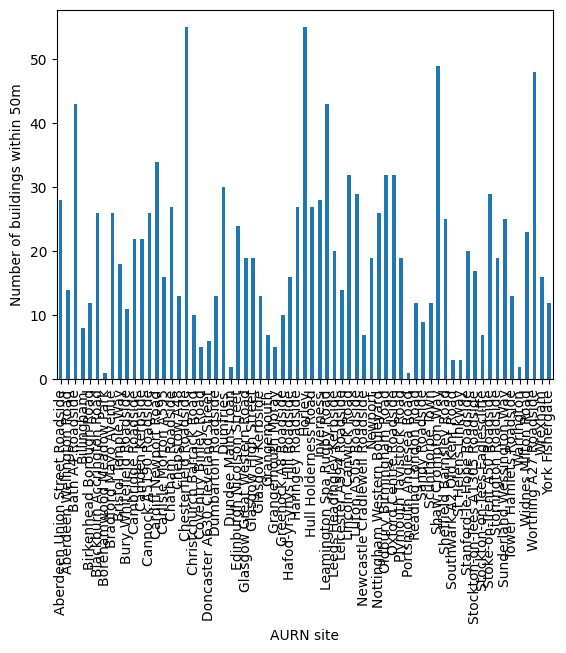

In [11]:
## group by AURN site and count the number of geometries - within 50m. Plot distribution with smaller labels
AURN_buildings.groupby('AURN').size().plot(kind='bar', ylabel='Number of buildings within 50m', xlabel='AURN site')

ValueError: `dataset` input should have multiple elements.

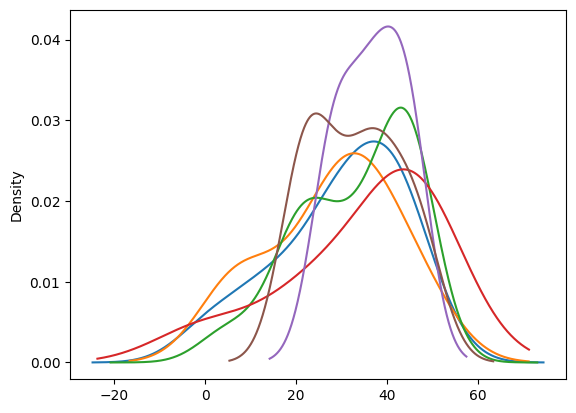

In [13]:
## group by AURN site and plot distribution of distance_to_point
AURN_buildings.groupby('AURN')['distance_to_point'].plot(kind='kde', ylabel='Density', xlabel='Distance to AURN site')